In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import pickle
import numpy as np
import matplotlib.pyplot as plt

from load_data import load_london, load_newyork, load_paris, load_gdf
from evaluation import print_comparison_results
from interpretation import (
    plot_calibration_comparison,
    plot_uncertainty_map_with_hatching,
    compute_feature_importance,
    plot_feature_importance,
    plot_regional_feature_importance,
)
from evaluation import print_comparison_results, hexaclus_pairing



c:\Users\Yameng\Documents\Research\HexaClusV2\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:

CITIES      = ['new_york', 'paris', 'london']
LOAD_FNS    = [load_newyork, load_paris, load_london]
SPLIT_RATE  = (0.7, 0.1, 0.2)
RESULTS_DIR = './results/'
PKL_FILE    = 'results.pkl'   # contains both clustering & baseline models


In [4]:
def load_city(city_idx, if_mapping):
    """Load results + data for one city.  Returns (results, gdf_splits, df_splits, label_scaler, label_cols)."""
    city      = CITIES[city_idx]
    save_path = RESULTS_DIR + city + '/'

    with open(save_path + PKL_FILE, 'rb') as f:
        results = pickle.load(f)
    if if_mapping:
        results =  mapping_result_key(results)

    df, label_scaler, label_cols = LOAD_FNS[city_idx](
        split_rate=SPLIT_RATE, scale=True, coords_only=False
    )
    df = df.reset_index(drop=True)
    (gdf_train, gdf_val,  gdf_test), (df_train, df_val, df_test) = load_gdf(df)

    print(f"City: {city.replace('_', ' ').upper()}")
    print(f"  train={len(df_train)}  val={len(df_val)}  test={len(df_test)}")
    print(f"  Models in results: {list(results.keys())}")
    return results, (gdf_train, gdf_val, gdf_test), (df_train, df_val, df_test), label_scaler, label_cols

def mapping_result_key(results):
    new_res = {}
    mapping_dict = {'clustering_bayesian' : 'HexaClus++ (bayesian)', 
                    'clustering_rf' : 'HexaClus++ (rf)', 
                    'clustering_gaussian' : 'HexaClus++ (gaussian)', 
                    'clustering_knn' : 'HexaClus++ (knn)', 
                    }
    for k, v in results.items():
        if 'clustering' in k :
            new_res[mapping_dict[k]] = v
        else:
            new_res[k] = v
    return new_res


## 1. Per-City Comparison Results
All metrics (RMSE, ECE, sharpness, interval width, coverage) are reported in the **original price/sqm scale**.  
NLL is always reported in normalised-log space (the space in which the Gaussian likelihood is defined).

In [ ]:
# New York 
results_ny, gdf_ny, df_ny, scaler_ny, cols_ny = load_city(0, if_mapping=True)

City: NEW YORK
  train=2913  val=416  test=833
  Models in results: ['HexaClus++ (bayesian)', 'HexaClus++ (knn)', 'HexaClus++ (rf)', 'HexaClus++ (gaussian)', 'bayesian', 'krigingrf', 'grfr', 'knn', 'gp', 'kriging', 'rf']


In [7]:
order, rename = hexaclus_pairing(results_ny)
df_ny_cmp = print_comparison_results(results_ny, label_scaler=scaler_ny, label_cols=cols_ny, order=order, rename=rename)
df_ny_cmp

,RMSE (orig.),MAE (orig.),Sharpness (orig.),Coverage (95%),ECE (orig.),Calib. Corr,Tuning Time (s),N Configs,Time/Config (s)
Model,,,,,,,,,
HexaClus++ (bayesian),556.9900,272.2448,322.7150,0.9423,39.7931,0.9813,583.8,162,3.6
bayesian,620.2045,343.8587,343.4697,0.9328,82.6178,0.9227,0.4,256,0.0
HexaClus++ (knn),450.3079,247.8459,257.4196,0.8872,42.4506,0.9907,252.5,30,8.4
knn,453.1871,221.5799,258.8354,0.9208,18.4119,0.9966,0.4,10,0.0
HexaClus++ (rf),421.8592,218.7019,259.1152,0.9363,34.3958,0.9894,7571.2,18,420.6
rf,412.1119,202.5718,246.7211,0.9448,31.1766,0.9940,3.3,18,0.2
HexaClus++ (gaussian),412.9006,212.7026,268.3068,0.9364,22.9493,0.9838,9174.6,12,764.6
gp,443.3992,205.2865,236.8087,0.9316,39.6281,0.9848,772.7,3,257.6
kriging,562.2826,315.2823,246.1662,0.8283,118.8927,0.9734,2796.2,4,699.1


## 2. Calibration Analysis
Calibration plots compare predicted std (x-axis) against observed MAE (y-axis) in the **original price/sqm scale**.  
A well-calibrated model tracks the diagonal.

Saved calibration comparison plot to ./results/new_york/calibration_comparison.png


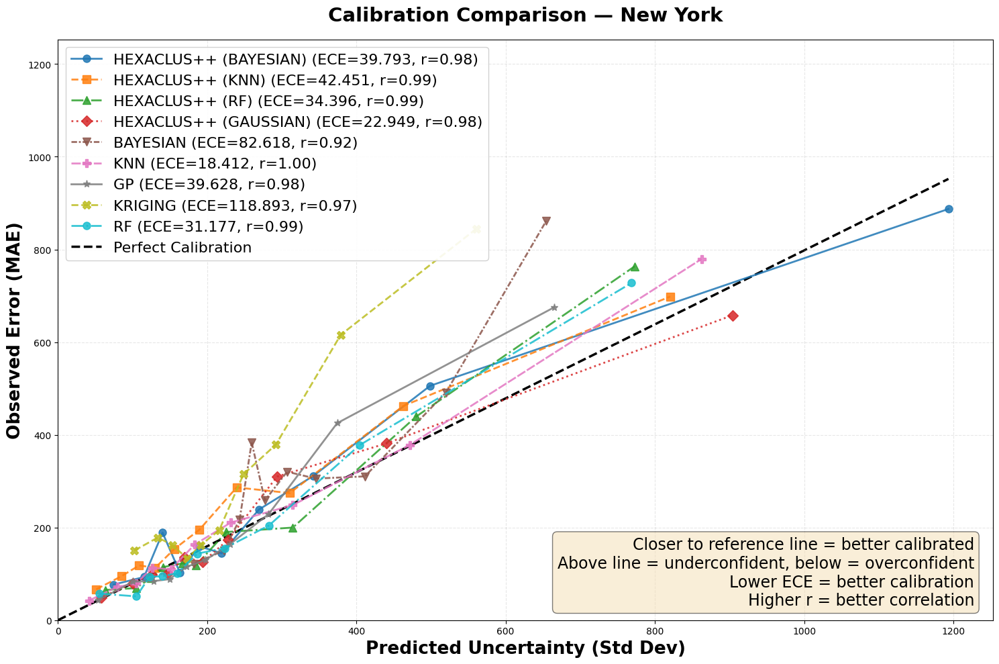

In [23]:
fig, ax = plot_calibration_comparison(
    results   = results_ny,
    n_bins    = 10,
    figsize   = (15, 10),
    title     = 'Calibration Comparison — New York',
    label_scaler = scaler_ny,
    label_cols   = cols_ny,
    save_path = RESULTS_DIR + 'new_york/calibration_comparison.png',
)
plt.show()

## 3. Uncertainty Map Visualisation
Prediction map with hatching overlay for high-uncertainty zones.

In [ ]:

results_map = [results_ny]
CITY_IDX   = 0    # 0=New York, 1=Paris, 2=London
MODEL_KEY  = 'HexaClus++ (rf)'
results_map = results_map[CITY_IDX]
city_label  = CITIES[CITY_IDX].replace('_', ' ').upper()
scaler      = [scaler_ny][CITY_IDX]
cols        = [cols_ny][CITY_IDX]

c:\Users\Yameng\Documents\Research\HexaClusV2\hexaclus_v2\interpretation.py:237: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend(loc='upper right', fontsize=10 + 5, framealpha=0.5)
c:\Users\Yameng\Documents\Research\HexaClusV2\hexaclus_v2\interpretation.py:237: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='upper right', fontsize=10 + 5, framealpha=0.5)


Saved hatched uncertainty map to ./results/london/HexaClus++ (rf)_uncertainty_map.png


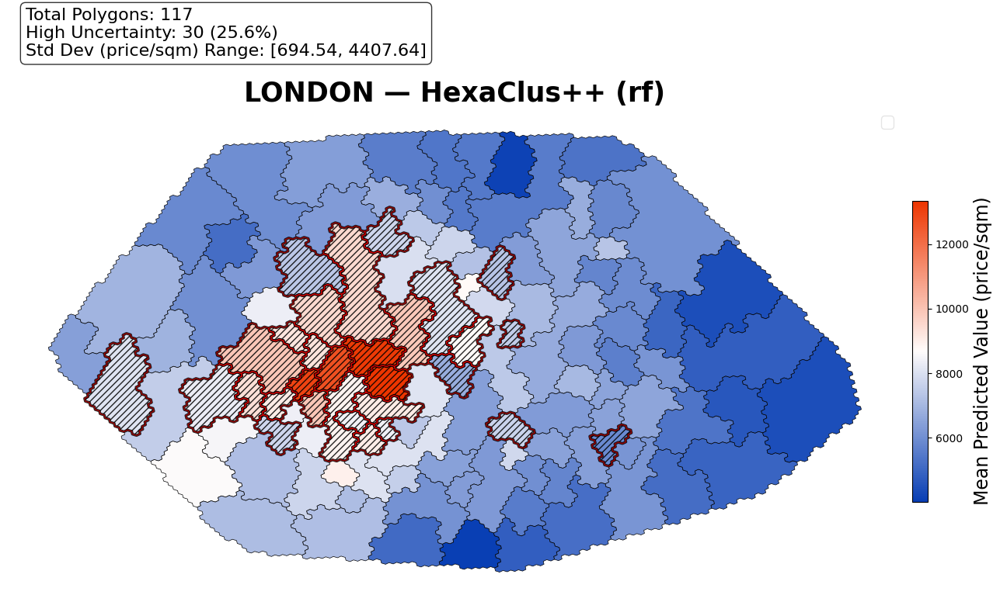

In [ ]:
m = results_map[MODEL_KEY]
plot_uncertainty_map_with_hatching(
    clustering_model = m['model'],
    test_instances = m['test_instance'],
    y_pred = np.array(m['test_pred']),
    std_pred = m['test_std'],
    uncertainty_threshold = 0.75,
    figsize = (14, 10),
    title = f"{city_label} — {MODEL_KEY}",
    save_path = RESULTS_DIR + CITIES[CITY_IDX] + f'/{MODEL_KEY}_uncertainty_map.png',
    label_scaler = scaler,
    label_cols = cols,
    unit = 'sqm'
)
plt.show()

## 4. Feature Importance
Permutation importance computed in **original price/sqm scale** — the drop in MSE (price/sqm²) when a feature is randomly shuffled.

In [ ]:

results_fi = results_map[CITY_IDX]
city_label = CITIES[CITY_IDX].replace('_', ' ').upper()
scaler_fi  = [scaler_ny][CITY_IDX]
cols_fi    = [cols_ny][CITY_IDX]

feature_groups = {
    'spatial' : ['offset_x', 'offset_y', 'offset_distance', 'offset_angle', 'x', 'y'],
    'hex2vec' : list(range(5)),
}
hedonic_feats = [
    c for c in results_fi[MODEL_KEY]['test_instance'].columns
    if c not in feature_groups['spatial']
    and c not in feature_groups['hex2vec']
    and c != 'label'
    and c != 'geometry'
]
feature_groups['hedonic'] = hedonic_feats
print('Hedonic features:', hedonic_feats)

Hedonic features: ['bathrooms', 'bedrooms', 'floorAreaSqM', 'livingRooms', 'tenure', 'propertyType', 'currentEnergyRating', 'history_date']


In [ ]:
individual_df, grouped_df = compute_feature_importance(
    clustering_model = results_fi[MODEL_KEY]['model'],
    test_instances = results_fi[MODEL_KEY]['test_instance'],
    feature_groups = feature_groups,
    n_repeats = 30,
    label_scaler = scaler_fi,
    label_cols = cols_fi,
    unit = 'sqm'
)

Saved feature importance plot to ./results/paris/global_feature_importance.png


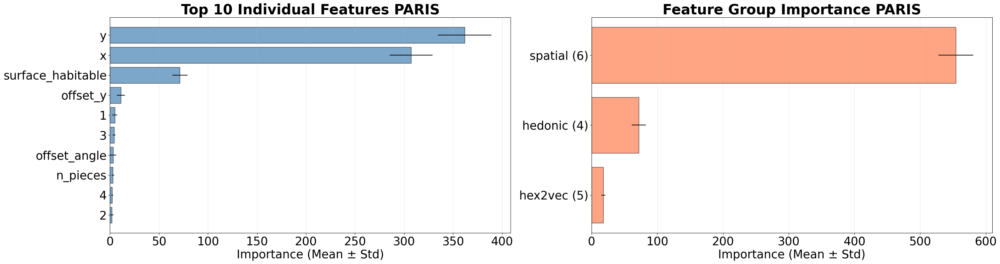

In [ ]:
plot_feature_importance(
    individual_df,
    grouped_df,
    top_n     = 10,
    figsize   = (30, 8),
    title     = f' {city_label}',
    save_path = RESULTS_DIR + CITIES[CITY_IDX] + '/global_feature_importance.png',
)
plt.show()

Computing regional feature importance...


c:\Users\Yameng\Documents\Research\HexaClusV2\.venv\Lib\site-packages\sklearn\utils\parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
c:\Users\Yameng\Documents\Research\HexaClusV2\.venv\Lib\site-packages\sklearn\utils\parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
c:\Users\Yameng\Documents\Research\HexaClusV2\.venv\Lib\site-packages\sklearn\utils\parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
c:\Users\Yameng\Doc

Saved regional feature importance map to ./results/paris/regional_feature_importance.png


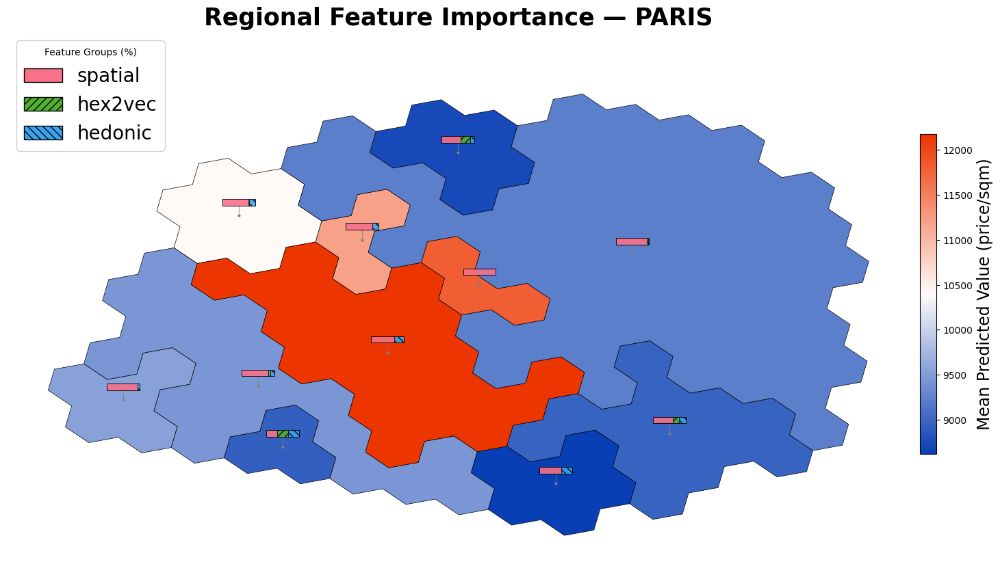

In [ ]:

fig, ax = plot_regional_feature_importance(
    results_fi[MODEL_KEY]['model'],
    test_instances = results_fi[MODEL_KEY]['test_instance'],
    feature_groups = feature_groups,
    y_pred         = np.array(results_fi[MODEL_KEY]['test_pred']),
    title          = f'Regional Feature Importance — {city_label}',
    save_path    = RESULTS_DIR + CITIES[CITY_IDX] + '/regional_feature_importance.png',
    label_scaler   = scaler_fi,
    label_cols     = cols_fi,
    unit = 'sqm'
)
plt.show()